# CIM Assignment 1 - Color Spaces and Perception


**Course**: Multimedia Information Codification  
**Academic Year**: 2025/2026    
**Authors**: Guilherme Rodrigues 202208878, João Oliveira 202205302         
**Date**: March 2026


---

## TASK 1 - Experimentation With Colour Spaces


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import cv2
import os
from skimage import io, color, filters, transform, exposure
from skimage.util import img_as_float, img_as_ubyte
import warnings
#warnings.filterwarnings('ignore')

# Set up plotting style
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

# Flags
DEBUG = 0

image_files = ['images/images/task1/floresVermelhas.bmp', 'images/images/task1/folhasVerdes.bmp', 
               'images/images/task1/nenufares.bmp', 'images/images/task1/testRGB.bmp']

### 1.1. RGB to HSV Conversion

**Objective**: Convert RGB images to HSV color space and analyze how hue, saturation, and value channels represent color information differently from RGB.

**Method Summary**: 
- Load test images (red flowers, green leaves, water lilies, RGB test pattern)
- Convert from RGB to HSV using `skimage.color.rgb2hsv()`
- Visualize individual R, G, B channels and H, S, V channels
- Compare channel representations across different color spaces

**Link to Perception Theory**: HSV mimics human color perception by separating color attributes: **Hue** (color type - what we name as "red" or "blue"), **Saturation** (color purity - how vivid vs. washed out), and **Value** (brightness - how light or dark). This aligns with how humans naturally describe colors, unlike RGB which mixes these attributes and is based on light emission.


Processing images/images/task1/floresVermelhas.bmp...


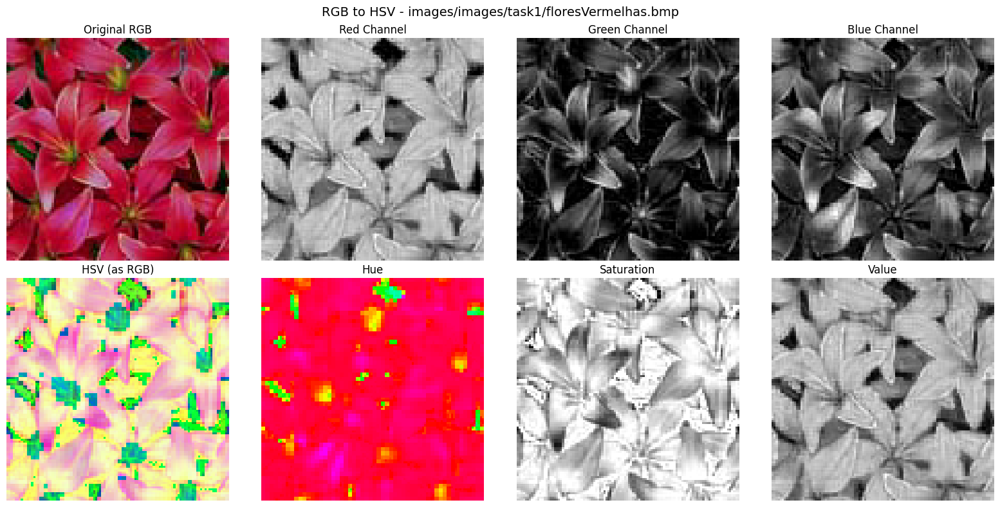


Processing images/images/task1/folhasVerdes.bmp...


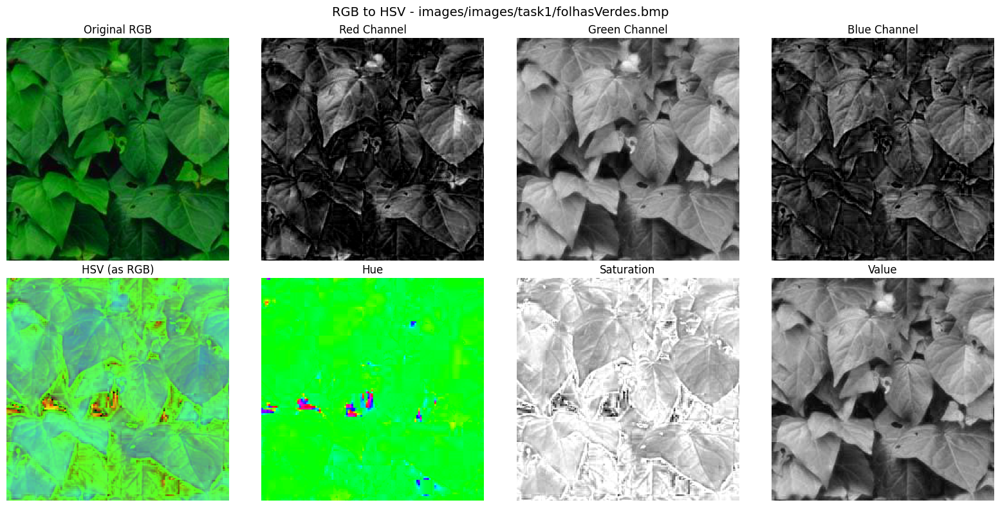


Processing images/images/task1/nenufares.bmp...


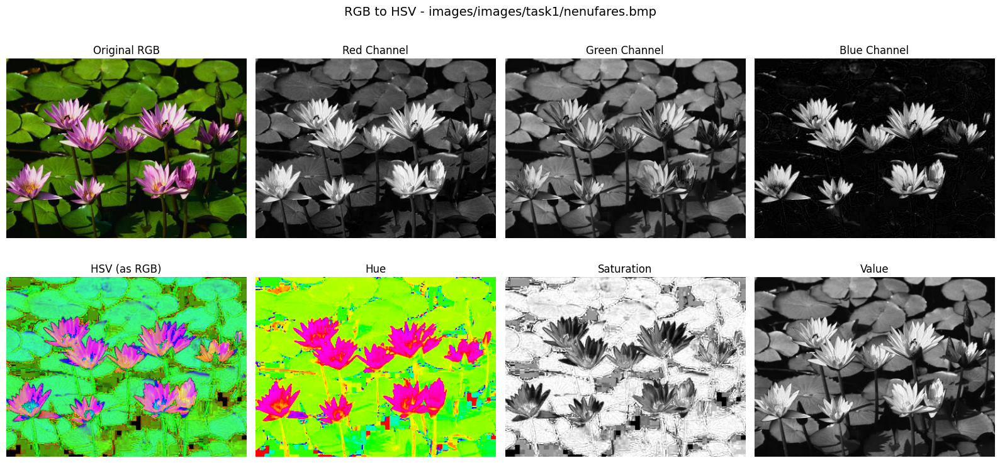


Processing images/images/task1/testRGB.bmp...


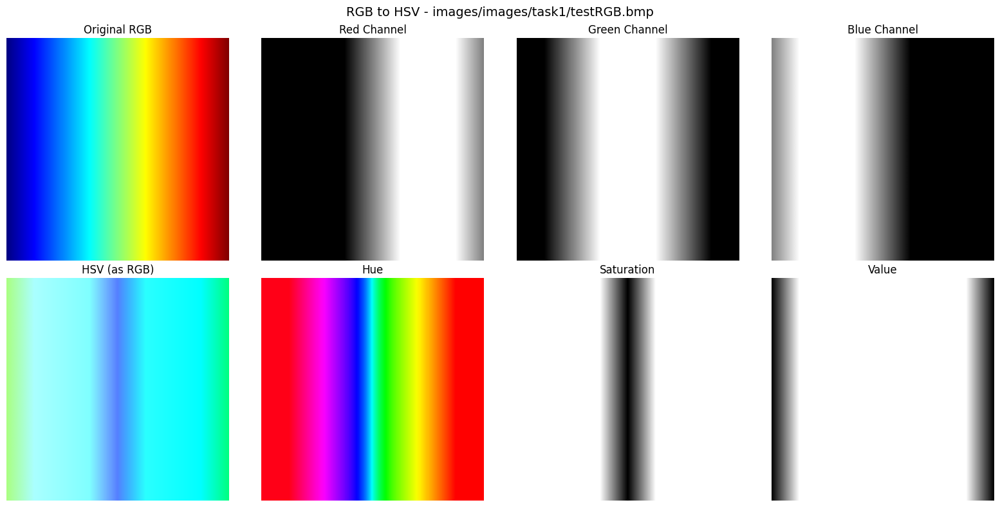

In [2]:
# Batch RGB to HSV conversion and visualization for multiple images
for img_file in image_files:
    # 1.1.1 Import and display original image
    img = io.imread(img_file)
    if img.ndim == 3 and img.shape[2] == 4:  # Remove alpha channel if present
        img = img[:, :, :3]
    print(f'\nProcessing {img_file}...')
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'RGB to HSV - {img_file}', fontsize=14)
    # 1.1.1 Display original RGB
    axes[0, 0].imshow(img)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')
    # 1.1.2 Separate and display RGB components
    for j, color_name in enumerate(['Red', 'Green', 'Blue']):
        component = np.zeros_like(img)
        component = img[:, :, j]
        axes[0, j+1].imshow(component, cmap='gray')
        axes[0, j+1].set_title(f'{color_name} Channel')
        axes[0, j+1].axis('off')
    # 1.1.3 Convert to HSV and display
    img_float = img_as_float(img)
    img_hsv = color.rgb2hsv(img_float)
    axes[1, 0].imshow(img_hsv)
    axes[1, 0].set_title('HSV (as RGB)')
    axes[1, 0].axis('off')
    # 1.1.4 Separate and display HSV components
    hsv_titles = ['Hue', 'Saturation', 'Value']
    hsv_cmaps = ['hsv', 'gray', 'gray']
    for j in range(3):
        axes[1, j+1].imshow(img_hsv[:, :, j], cmap=hsv_cmaps[j])
        axes[1, j+1].set_title(f'{hsv_titles[j]}')
        axes[1, j+1].axis('off')
    plt.tight_layout()
    plt.show()  

#### Key Observations - HSV colour space

**RGB Channels:**
In each RGB channel, there is high intensity where that channel's colour content exists. For example, in the red flowers image, the red channel is very bright and the other channels dark. The same goes for the green flowers image (green channel very bright and the others dark). In the nenufares image there is a mix of the three channels (green for the nenufares and red/blue for the flowers). In the test RGB image we can see very clearly where each colour is more represented (red in the right, green in the middle and blue in the left)


**HSV Channels:**
- **Hue (H)**: Encodes pure color type (red ≈ 0°, green ≈ 120°, blue ≈ 240°), separating colored regions independent of brightness
- **Saturation (S)**: Measures color purity (vivid colors = high, washed-out/gray = low)
- **Value (V)**: Represents overall brightness, similar to grayscale

The HSV colour map decouples **what color** (Hue) from **how vivid** (Saturation) and **how bright** (Value). For example, in the red flower image, Hue clearly isolates red vs. green regions, while Value shows the overall lighting (the flowers are brighter in the nenufares image). This separation is impossible in RGB where all three channels respond to both color and brightness.

HSV is more related to how the human visual system processes images by decomposing color into components that align with how people intuitively describe and perceive color. It provides intuitive color manipulation because Hue directly corresponds to the "name" of a color (red, green, blue), making color-based segmentation straightforward without worrying about lighting variations (which primarily affect Value and Saturation).

### 1.2. RGB to YCbCr Conversion

**Objective**: Convert RGB images to YCbCr color space and understand how luminance-chrominance separation enables efficient image/video compression.

**Method Summary**:\
- Convert RGB images to YCbCr using `skimage.color.rgb2ycbcr()`
- Extract and visualize Y (luminance), Cb (blue chrominance), and Cr (red chrominance) channels
- Compare with RGB channel representations

**Link to Perception Theory**: YCbCr exploits the human visual system's higher sensitivity to luminance (brightness) than chrominance (color). The HVS has approximately 100x more luminance receptors (rods + cones) than color-opponent channels. This allows aggressive compression of Cb and Cr channels (chroma subsampling 4:2:0) with minimal perceived quality loss.


Processing images/images/task1/floresVermelhas.bmp...


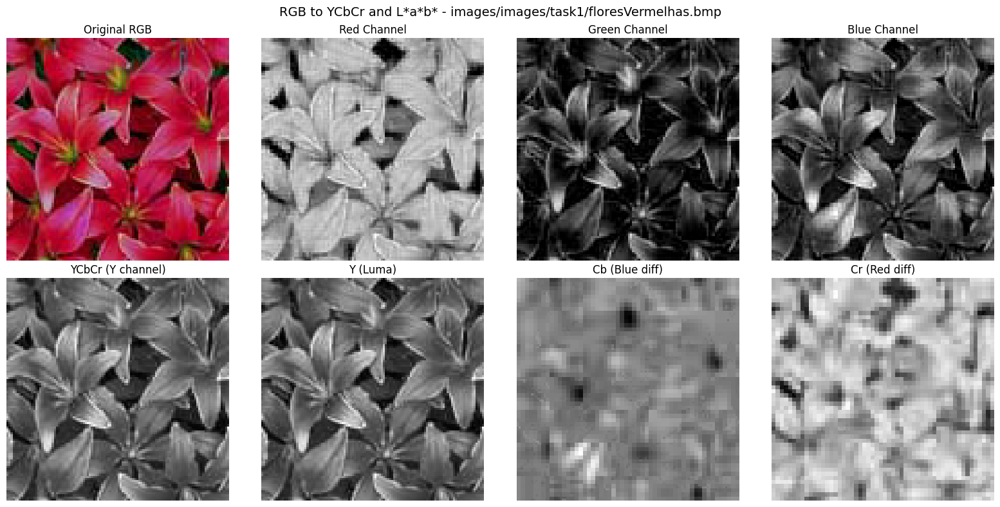


Processing images/images/task1/folhasVerdes.bmp...


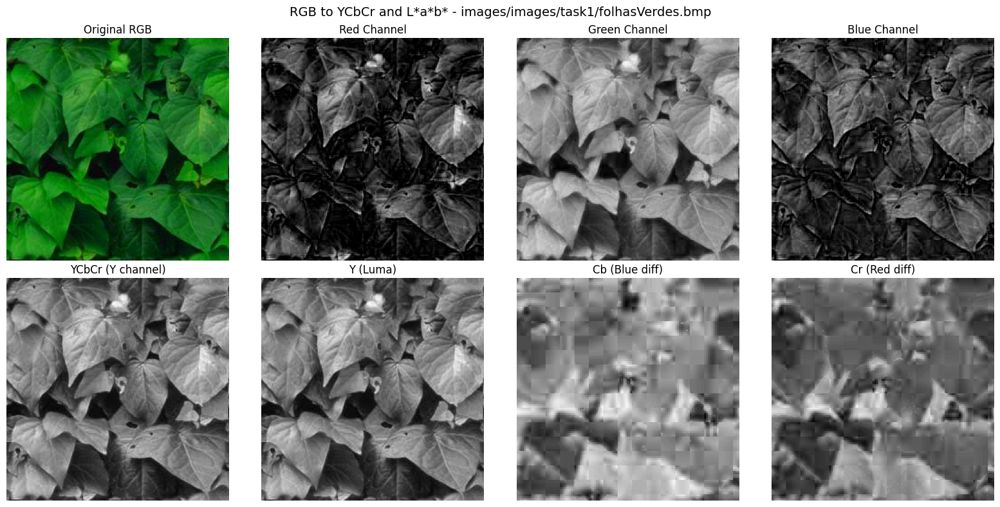


Processing images/images/task1/nenufares.bmp...


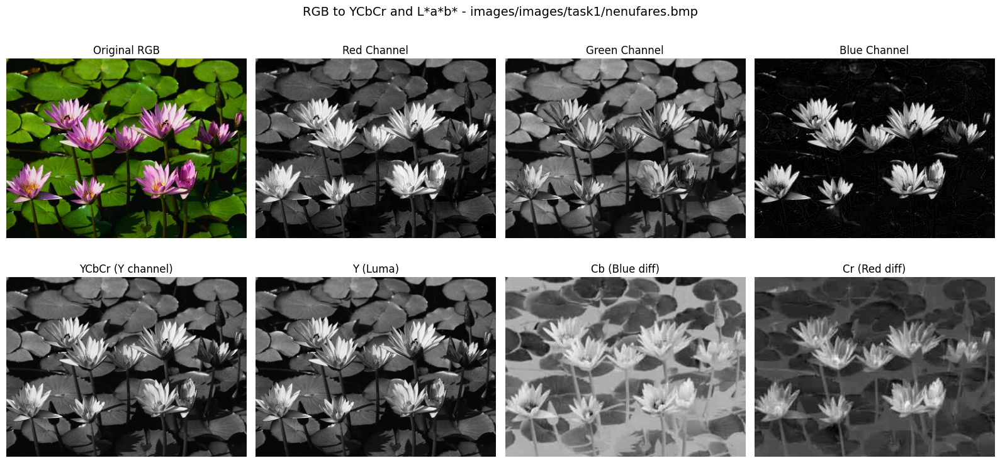


Processing images/images/task1/testRGB.bmp...


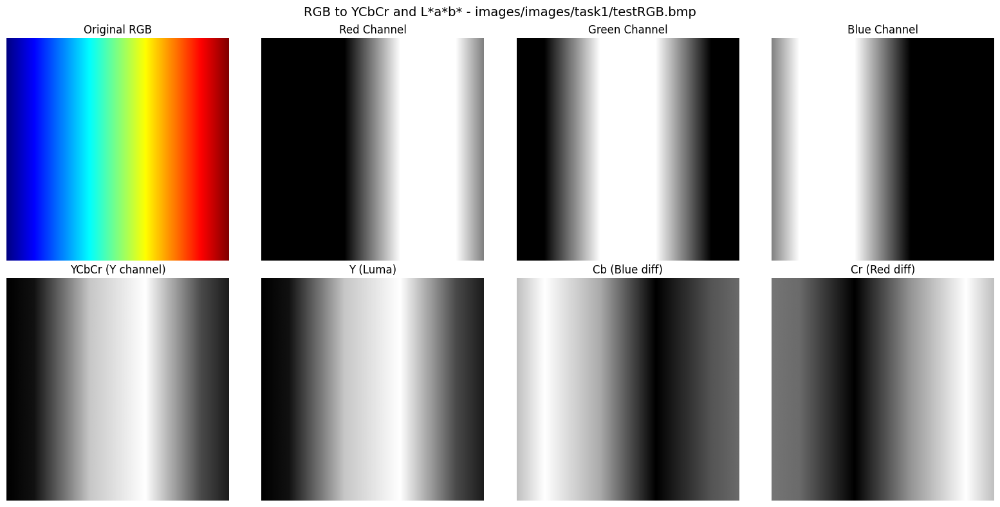

In [3]:
for img_file in image_files:
    # 1.1.1 Import and display original image
    img = io.imread(img_file)
    if img.ndim == 3 and img.shape[2] == 4:  # Remove alpha channel if present
        img = img[:, :, :3]
    
    print(f'\nProcessing {img_file}...')
    
    # Create figure with 2 rows, 4 columns
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'RGB to YCbCr and L*a*b* - {img_file}', fontsize=14)
    
    # 1.1.1 Display original RGB
    axes[0, 0].imshow(img)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')
    
    # 1.1.2 Separate and display RGB components
    for j, color_name in enumerate(['Red', 'Green', 'Blue']):
        component = np.zeros_like(img)
        component = img[:, :, j]
        axes[0, j+1].imshow(component, cmap='gray')
        axes[0, j+1].set_title(f'{color_name} Channel')
        axes[0, j+1].axis('off')
    
    # Convert to float for color space conversions
    img_float = img_as_float(img)
    
    # 1.1.3 Convert to YCbCr and display
    img_ycbcr = color.rgb2ycbcr(img_float)
    axes[1, 0].imshow(img_ycbcr[:, :, 0], cmap='gray')  # Y (luma) as grayscale
    axes[1, 0].set_title('YCbCr (Y channel)')
    axes[1, 0].axis('off')
    
    # 1.1.4 Separate and display YCbCr components
    ycbcr_titles = ['Y (Luma)', 'Cb (Blue diff)', 'Cr (Red diff)']
    ycbcr_cmaps = ['gray', 'gray', 'gray']
    for j in range(3):
        axes[1, j+1].imshow(img_ycbcr[:, :, j], cmap=ycbcr_cmaps[j])
        axes[1, j+1].set_title(f'{ycbcr_titles[j]}')
        axes[1, j+1].axis('off')
    
    plt.tight_layout()
    plt.show()

#### Key Observations - YCbCr Color Space

**YCbCr Channels:**
- **Y (Luminance)**: Contains brightness information, similar to grayscale. Preserves edges and structural details - the most important channel for human perception
- **Cb (Blue Chrominance)**: Blue-yellow color difference (positive = blue, negative = yellow)
- **Cr (Red Chrominance)**: Red-green color difference (positive = red, negative = green)

YCbCr achieves complete separation of luminance from color. In the used images, the Y channel retains all structural information while Cb and Cr contain only color data. For example, in the red flowers and nenufares images, it's possible to distiguinsh the different colours in both Cb and Cr.

The HVS (human visual system) processes luminance (Y) with much higher spatial resolution than chrominance. We have ~100 million rods + cones for brightness but only ~6-7 million cones for color. YCbCr exploits this asymmetry - Cb/Cr can be spatially subsampled with minimal perceptual impact.

YCbCr is optimal for compression because it matches HVS sensitivity: full-resolution Y preserves perceived sharpness, while downsampled Cb/Cr sacrifices imperceptible color detail to achieve a good compression ratio.

### 1.3. RGB to L*a*b Conversion

**Objective**: Convert RGB images to L*a*b color space and understand perceptual uniformity and opponent color representation.

**Method Summary**:
- Convert RGB to L*a*b using `skimage.color.rgb2lab()`
- Visualize L* (lightness), a* (green-red axis), b* (blue-yellow axis)
- Analyze perceptual uniformity and color separability
- Compare histogram distributions with RGB

**Link to Perception Theory**: L*a*b is based on opponent color theory - the HVS processes color through antagonistic channels: red vs. green (a*) and blue vs. yellow (b*), separate from lightness (L*). This space is **perceptually uniform**: equal numerical distances (ΔE = √(ΔL*² + Δa*² + Δb*²)) correspond to equal perceived color differences, unlike RGB where (10,10,10) vs (20,20,20) is perceived very differently than (200,200,200) vs (210,210,210).


Processing images/images/task1/floresVermelhas.bmp...


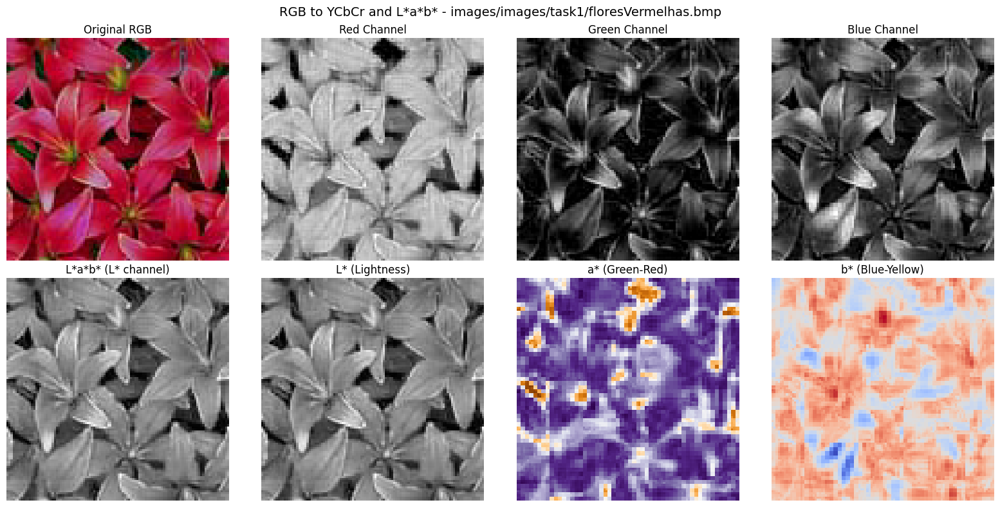


Processing images/images/task1/folhasVerdes.bmp...


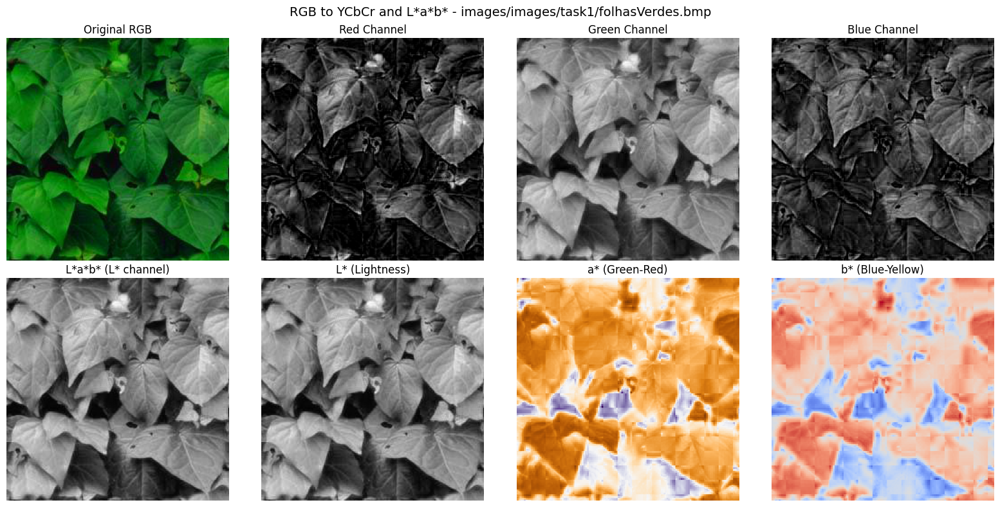


Processing images/images/task1/nenufares.bmp...


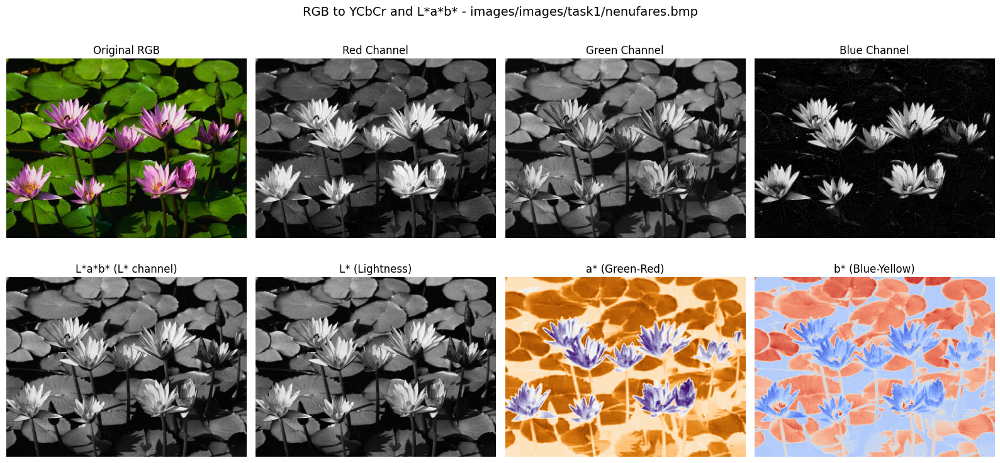


Processing images/images/task1/testRGB.bmp...


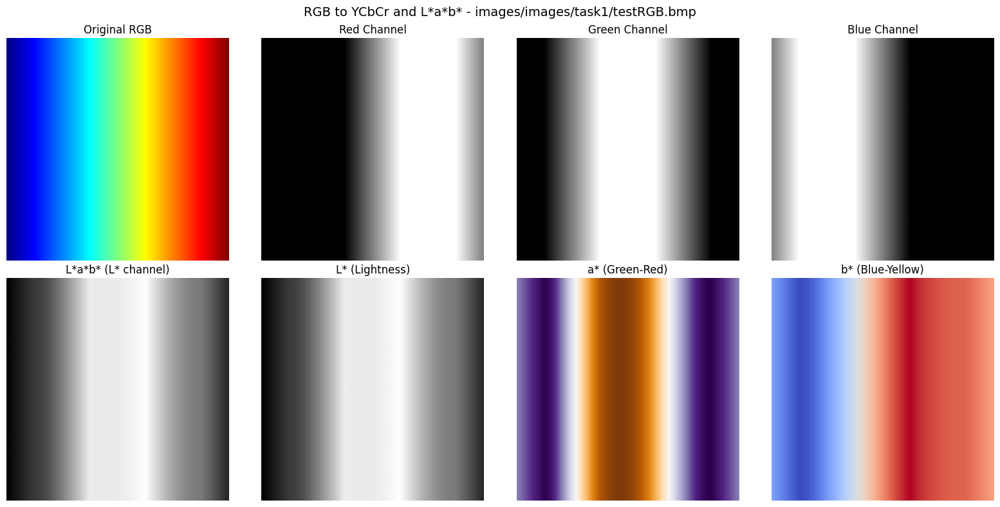

In [4]:
for img_file in image_files:    
    # 1.1.1 Import and display original image
    img = io.imread(img_file)
    if img.ndim == 3 and img.shape[2] == 4:  # Remove alpha channel if present
        img = img[:, :, :3]
    
    print(f'\nProcessing {img_file}...')
    
    # Create figure with 2 rows, 4 columns
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'RGB to YCbCr and L*a*b* - {img_file}', fontsize=14)
    
    # 1.1.1 Display original RGB
    axes[0, 0].imshow(img)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')
    
    # 1.1.2 Separate and display RGB components (repeat)
    for j, color_name in enumerate(['Red', 'Green', 'Blue']):
        component = np.zeros_like(img)
        component = img[:, :, j]
        axes[0, j+1].imshow(component,cmap = 'gray')
        axes[0, j+1].set_title(f'{color_name} Channel')
        axes[0, j+1].axis('off')
    
    # 1.1.5 Convert to L*a*b* and display
    img_float = img_as_float(img)
    img_lab = color.rgb2lab(img_float)
    axes[1, 0].imshow(img_lab[:, :, 0], cmap='gray')  # L* channel as grayscale
    axes[1, 0].set_title('L*a*b* (L* channel)')
    axes[1, 0].axis('off')
    
    # 1.1.6 Separate and display L*a*b* components
    lab_titles = ['L* (Lightness)', 'a* (Green-Red)', 'b* (Blue-Yellow)']
    lab_cmaps = ['gray', 'PuOr', 'coolwarm']
    for j in range(3):
        axes[1, j+1].imshow(img_lab[:, :, j], cmap=lab_cmaps[j])
        axes[1, j+1].set_title(f'{lab_titles[j]}')
        axes[1, j+1].axis('off')
    
    plt.tight_layout()
    plt.show()

#### Key Observations - L*a*b Color Space

**L*a*b Channels:**
- **L\* (Lightness)**: 0-100 scale, perceptually calibrated brightness (L*=50 appears halfway between black and white to human eye)
- **a\* (Green-Red)**: Negative = green, positive = red, zero = neutral. Red flowers show strong positive values
- **b\* (Blue-Yellow)**: Negative = blue, positive = yellow, zero = neutral. Sky shows strong negative values

L*a*b provides the most perceptually meaningful color representation. In red flower images, a* clearly isolates red regions (+) from green (-), independent of lighting. The b* channel separates warm (yellow) from cool (blue) tones, as we can see in the rgb test image.

L*a*b directly models opponent color processing in the HVS. The retina contains cells that are excited by red and inhibited by green (and vice versa) - this is the a* axis. Similarly, blue-excited/yellow-inhibited cells correspond to b*.


### 1.4. Histogram

Generating color histograms for RGB and L*a*b color spaces...
This analysis compares the information content and separability of the two color spaces.



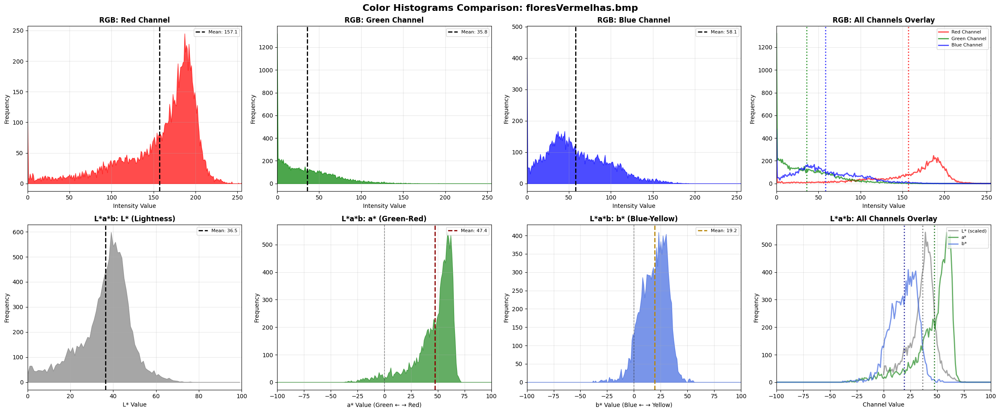

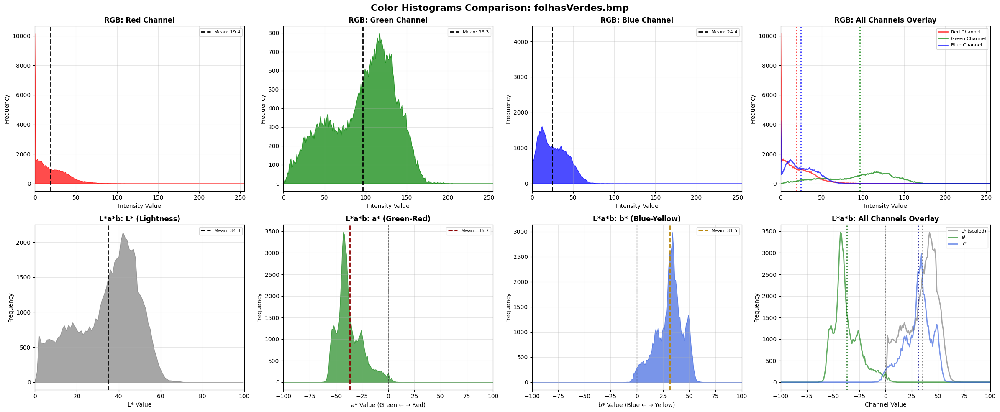

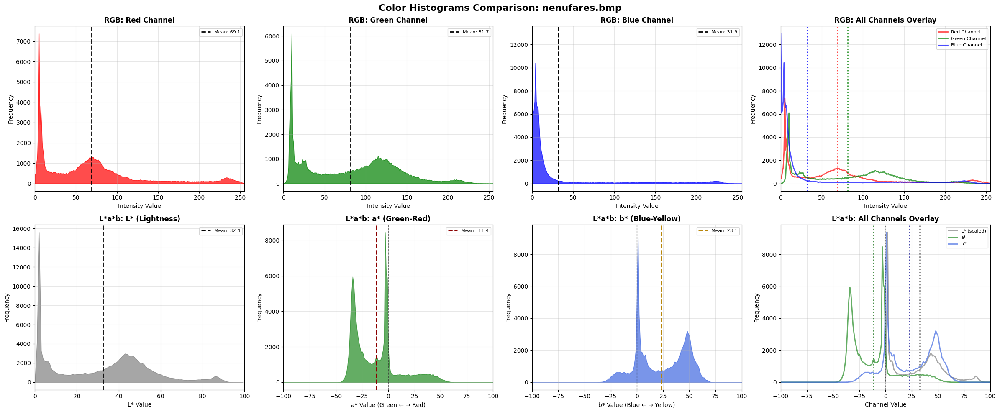

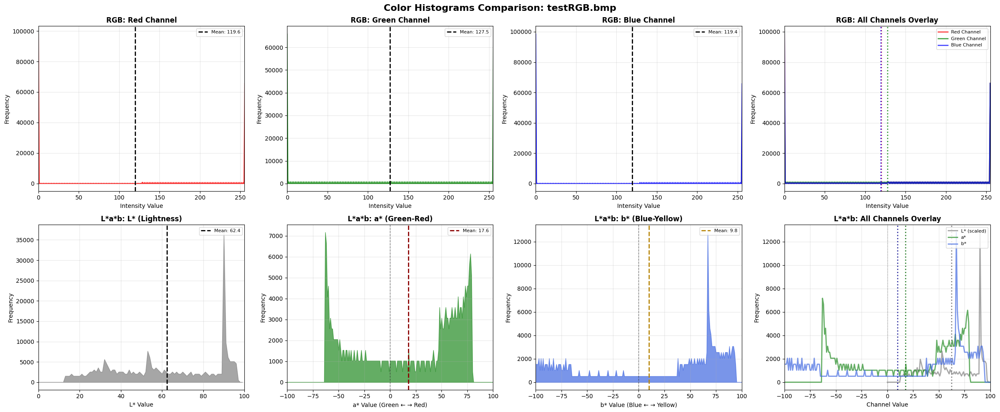

In [5]:
def plot_color_histograms(img, img_lab, title="Image"):
    """
    Generate and compare color histograms for RGB and L*a*b color spaces.
    
    Parameters:
    -----------
    img : ndarray
        RGB image (H x W x 3)
    img_lab : ndarray
        L*a*b image (H x W x 3)
    title : str
        Image title for the plot
    """
    fig, axes = plt.subplots(2, 4, figsize=(24, 10))  # Added one column for overlay
    fig.suptitle(f'Color Histograms Comparison: {title}', fontsize=16, fontweight='bold')
    
    # ===== RGB Histograms (Row 1, Cols 0-2) =====
    rgb_colors = ['red', 'green', 'blue']
    rgb_labels = ['Red Channel', 'Green Channel', 'Blue Channel']
    
    for i, (color, label) in enumerate(zip(rgb_colors, rgb_labels)):
        # Calculate histogram for each RGB channel
        hist, bins = np.histogram(img[:, :, i].flatten(), bins=256, range=(0, 256))
        axes[0, i].fill_between(bins[:-1], hist, color=color, alpha=0.7)
        axes[0, i].set_title(f'RGB: {label}', fontsize=12, fontweight='bold')
        axes[0, i].set_xlabel('Intensity Value')
        axes[0, i].set_ylabel('Frequency')
        axes[0, i].set_xlim([0, 255])
        axes[0, i].grid(True, alpha=0.3)
        
        # Add mean line
        mean_val = np.mean(img[:, :, i])
        axes[0, i].axvline(x=mean_val, color='black', linestyle='--', 
                          linewidth=2, label=f'Mean: {mean_val:.1f}')
        axes[0, i].legend(loc='upper right', fontsize=8)
    
    # ===== RGB Overlay (Row 1, Col 3) =====
    for i, (color, label) in enumerate(zip(rgb_colors, rgb_labels)):
        hist, bins = np.histogram(img[:, :, i].flatten(), bins=256, range=(0, 256))
        axes[0, 3].plot(bins[:-1], hist, color=color, linewidth=2, 
                       alpha=0.7, label=f'{label}')
        
        # Add mean lines for overlay
        mean_val = np.mean(img[:, :, i])
        axes[0, 3].axvline(x=mean_val, color=color, linestyle=':', 
                          linewidth=2, alpha=0.8)
    
    axes[0, 3].set_title('RGB: All Channels Overlay', fontsize=12, fontweight='bold')
    axes[0, 3].set_xlabel('Intensity Value')
    axes[0, 3].set_ylabel('Frequency')
    axes[0, 3].set_xlim([0, 255])
    axes[0, 3].grid(True, alpha=0.3)
    axes[0, 3].legend(loc='upper right', fontsize=8)
    
    # ===== L*a*b Histograms (Row 2, Cols 0-2) =====
    lab_labels = ['L* (Lightness)', 'a* (Green-Red)', 'b* (Blue-Yellow)']
    lab_colors = ['gray', 'forestgreen', 'royalblue']
    
    # L* channel
    hist_l, bins_l = np.histogram(img_lab[:, :, 0].flatten(), bins=100, range=(0, 100))
    axes[1, 0].fill_between(bins_l[:-1], hist_l, color='gray', alpha=0.7)
    axes[1, 0].set_title(f'L*a*b: {lab_labels[0]}', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('L* Value')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].set_xlim([0, 100])
    axes[1, 0].grid(True, alpha=0.3)
    
    mean_l = np.mean(img_lab[:, :, 0])
    axes[1, 0].axvline(x=mean_l, color='black', linestyle='--', 
                      linewidth=2, label=f'Mean: {mean_l:.1f}')
    axes[1, 0].legend(loc='upper right', fontsize=8)
    
    # a* channel
    hist_a, bins_a = np.histogram(img_lab[:, :, 1].flatten(), bins=256, range=(-128, 128))
    axes[1, 1].fill_between(bins_a[:-1], hist_a, color='forestgreen', alpha=0.7)
    axes[1, 1].set_title(f'L*a*b: {lab_labels[1]}', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('a* Value (Green ← → Red)')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].set_xlim([-100, 100])
    axes[1, 1].axvline(x=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    axes[1, 1].grid(True, alpha=0.3)
    
    mean_a = np.mean(img_lab[:, :, 1])
    axes[1, 1].axvline(x=mean_a, color='darkred', linestyle='--', 
                      linewidth=2, label=f'Mean: {mean_a:.1f}')
    axes[1, 1].legend(loc='upper right', fontsize=8)
    
    # b* channel
    hist_b, bins_b = np.histogram(img_lab[:, :, 2].flatten(), bins=256, range=(-128, 128))
    axes[1, 2].fill_between(bins_b[:-1], hist_b, color='royalblue', alpha=0.7)
    axes[1, 2].set_title(f'L*a*b: {lab_labels[2]}', fontsize=12, fontweight='bold')
    axes[1, 2].set_xlabel('b* Value (Blue ← → Yellow)')
    axes[1, 2].set_ylabel('Frequency')
    axes[1, 2].set_xlim([-100, 100])
    axes[1, 2].axvline(x=0, color='black', linestyle='--', linewidth=1, alpha=0.5)
    axes[1, 2].grid(True, alpha=0.3)
    
    mean_b = np.mean(img_lab[:, :, 2])
    axes[1, 2].axvline(x=mean_b, color='darkgoldenrod', linestyle='--', 
                      linewidth=2, label=f'Mean: {mean_b:.1f}')
    axes[1, 2].legend(loc='upper right', fontsize=8)
    
    # ===== L*a*b Overlay (Row 2, Col 3) =====
    # L* channel (normalized for visibility)
    hist_l_norm = hist_l / np.max(hist_l) * np.max([hist_a, hist_b])
    axes[1, 3].plot(bins_l[:-1], hist_l_norm, color='gray', linewidth=2,
                   alpha=0.7, label='L* (scaled)')
    
    # a* channel
    axes[1, 3].plot(bins_a[:-1], hist_a, color='forestgreen', linewidth=2,
                   alpha=0.7, label='a*')
    
    # b* channel
    axes[1, 3].plot(bins_b[:-1], hist_b, color='royalblue', linewidth=2,
                   alpha=0.7, label='b*')
    
    # Add zero line for reference
    axes[1, 3].axvline(x=0, color='black', linestyle=':', linewidth=1, alpha=0.5)
    
    # Add mean lines
    axes[1, 3].axvline(x=mean_l, color='dimgray', linestyle=':', linewidth=2, alpha=0.8)
    axes[1, 3].axvline(x=mean_a, color='darkgreen', linestyle=':', linewidth=2, alpha=0.8)
    axes[1, 3].axvline(x=mean_b, color='darkblue', linestyle=':', linewidth=2, alpha=0.8)
    
    axes[1, 3].set_title('L*a*b: All Channels Overlay', fontsize=12, fontweight='bold')
    axes[1, 3].set_xlabel('Channel Value')
    axes[1, 3].set_ylabel('Frequency')
    axes[1, 3].set_xlim([-100, 100])
    axes[1, 3].grid(True, alpha=0.3)
    axes[1, 3].legend(loc='upper right', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    # Generate histograms for all images
print("Generating color histograms for RGB and L*a*b color spaces...")
print("This analysis compares the information content and separability of the two color spaces.\n")

for img_file in image_files:
    # Load image
    img = io.imread(img_file)
    if img.ndim == 3 and img.shape[2] == 4:  # Remove alpha channel if present
        img = img[:, :, :3]
    
    # Convert to L*a*b
    img_float = img_as_float(img)
    img_lab = color.rgb2lab(img_float)
    
    # Extract filename for title
    filename = os.path.basename(img_file)
    
    # Plot histograms
    plot_color_histograms(img, img_lab, title=filename)

#### RGB vs L*a*b Histograms

Above we have RGB and L*a*b histograms for the different images. RGB histograms show the distribution of light intensity in each primary color channel. As discussed, it is difficult to separate color information from brightness information. The three channels are not independent, a change in brightness affects all three channels simultaneously. In L*a*b there is separability between luminance and chrominance.
In the red flowers image, for example, there are many pixels with a high value for the red channel and then the green and blue channels do not have very high values (many pixels have even null or close to 0 values), while in L*a*b, almost all pixels have non-zero values in every channel, meaning there is a higher channel separability in L*a*b
   

---

## Task 2: Image Resizing 



### 2.1 Naive Resizing

In this section, we implement the simplest form of image resizing:
- **Downsampling**: Remove pixels by taking every nth pixel (e.g., every 2nd pixel reduces size by factor of 2)
- **Upsampling**: Replicate pixels using nearest-neighbor interpolation

This naive approach is computationally fast but can introduce artifacts:
- **Downsampling artifacts**: Aliasing due to high-frequency content being undersampled
- **Upsampling artifacts**: Blocky appearance due to pixel replication

TASK 2.1: NAIVE RESIZING - COMPLETE ANALYSIS
Testing with 3 different images:
  • Zone Plate (synthetic test pattern)
  • Barbara (natural image with textures)
  • Building (architectural image with regular patterns)

[1] Loading/creating test images...
    ✓ Zone plate created (256×256 and 128×128)
    ✓ Barbara loaded (256×256)
    ✓ Building loaded (256×256)

[2] Creating 64×64 crops for upsampling demonstration...
    ✓ 64×64 crops created

[3] Performing naive resizing operations...
    ✓ Downsampling: 256×256 → 128×128 (factor 2)

    ✓ Extra: Creating 64×64 downsampled zone plate to emphasize aliasing...
    ✓ Upsampling: 64×64 → 256×256 (factor 4)

[4] Generating comprehensive visualizations with images, histograms, signal variation, and spectra...


ZONE PLATE ANALYSIS


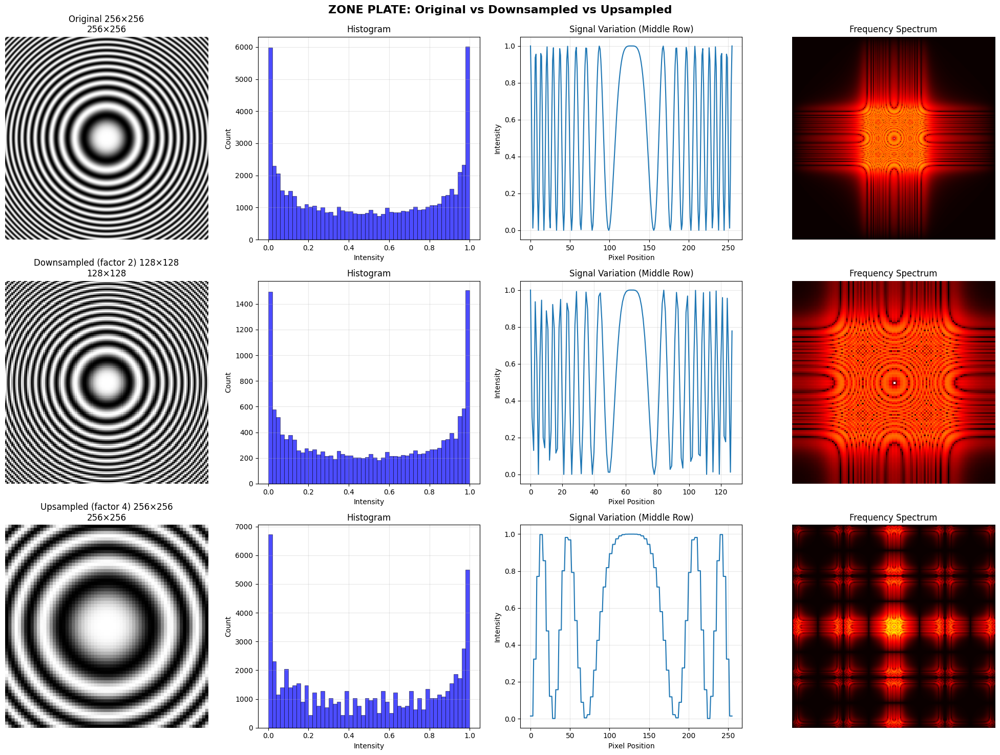


BARBARA ANALYSIS


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def imzoneplate(size=512):
    """Generate a zone plate test image."""
    x, y = np.meshgrid(np.linspace(-1, 1, size), np.linspace(-1, 1, size))
    r = np.sqrt(x**2 + y**2)
    z = np.cos(20 * np.pi * r**2)
    return (z + 1) / 2  # Normalize to [0, 1] range

def naive_downsample(img, factor):
    """Downsample by removing pixels (take every nth pixel)."""
    return img[::factor, ::factor]

def naive_upsample(img, factor):
    """Upsample by pixel replication (nearest-neighbor style)."""
    return np.repeat(np.repeat(img, factor, axis=0), factor, axis=1)

def plot_comprehensive_analysis(img, title, ax_row):
    """Plot image, histogram, signal variation, and spectrum for a single image."""
    # Image
    ax_row[0].imshow(img, cmap='gray', vmin=0, vmax=1)
    ax_row[0].set_title(f'{title}\n{img.shape[0]}×{img.shape[1]}')
    ax_row[0].axis('off')
    
    # Histogram
    ax_row[1].hist(img.ravel(), bins=50, color='blue', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax_row[1].set_title('Histogram')
    ax_row[1].set_xlabel('Intensity')
    ax_row[1].set_ylabel('Count')
    ax_row[1].grid(True, alpha=0.3)
    
    # Signal variation (middle row)
    ax_row[2].plot(img[img.shape[0] // 2, :])
    ax_row[2].set_title('Signal Variation (Middle Row)')
    ax_row[2].set_xlabel('Pixel Position')
    ax_row[2].set_ylabel('Intensity')
    ax_row[2].grid(True, alpha=0.3)
    
    # Frequency spectrum
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
    ax_row[3].imshow(magnitude_spectrum, cmap='hot')
    ax_row[3].set_title('Frequency Spectrum')
    ax_row[3].axis('off')

# ==================== MAIN PROGRAM ====================

print("=" * 70)
print("TASK 2.1: NAIVE RESIZING - COMPLETE ANALYSIS")
print("=" * 70)
print("Testing with 3 different images:")
print("  • Zone Plate (synthetic test pattern)")
print("  • Barbara (natural image with textures)")
print("  • Building (architectural image with regular patterns)")
print("=" * 70)

# 1. CREATE/LOAD TEST IMAGES
print("\n[1] Loading/creating test images...")

# Zone plate
zoneplate_256 = imzoneplate(256)
zoneplate_128 = imzoneplate(128)
print("    ✓ Zone plate created (256×256 and 128×128)")

# Barbara
barbara = np.array(Image.open('images/images/task2/Barbara.png').convert('L')) / 255.0
# Crop to 256×256 if needed
if barbara.shape[0] > 256:
    barbara = barbara[:256, :256]
print("    ✓ Barbara loaded (256×256)")

# Building
building = np.array(Image.open('images/images/task2/building.png').convert('L')) / 255.0
if building.shape[0] > 256:
    building = building[:256, :256]
print("    ✓ Building loaded (256×256)")

# 2. CREATE CROPS FOR UPSAMPLING
print("\n[2] Creating 64×64 crops for upsampling demonstration...")

zoneplate_crop = zoneplate_128[32:96, 32:96]  # 64×64 crop
barbara_crop = barbara[96:160, 96:160]        # 64×64 crop
building_crop = building[96:160, 96:160]       # 64×64 crop
print("    ✓ 64×64 crops created")

# 3. PERFORM NAIVE RESIZING
print("\n[3] Performing naive resizing operations...")

# Downsampling (256×256 → 128×128)
zoneplate_down = naive_downsample(zoneplate_256, 2)
barbara_down = naive_downsample(barbara, 2)
building_down = naive_downsample(building, 2)
print("    ✓ Downsampling: 256×256 → 128×128 (factor 2)")

# Extra: 64×64 downsampling to emphasize aliasing
print("\n    ✓ Extra: Creating 64×64 downsampled zone plate to emphasize aliasing...")
zoneplate_down_64 = naive_downsample(zoneplate_256, 4)  # 256→64 (factor 4)

# Upsampling (64×64 → 256×256)
zoneplate_up = naive_upsample(zoneplate_crop, 4)
barbara_up = naive_upsample(barbara_crop, 4)
building_up = naive_upsample(building_crop, 4)
print("    ✓ Upsampling: 64×64 → 256×256 (factor 4)")

# ==================== VISUALIZATION ====================

print("\n[4] Generating comprehensive visualizations with images, histograms, signal variation, and spectra...\n")

# === ZONE PLATE ANALYSIS ===
print("\n" + "="*60)
print("ZONE PLATE ANALYSIS")
print("="*60)

fig1, axes = plt.subplots(3, 4, figsize=(20, 15))
fig1.suptitle('ZONE PLATE: Original vs Downsampled vs Upsampled', fontsize=16, fontweight='bold')

# Row 0: Original 256×256
plot_comprehensive_analysis(zoneplate_256, 'Original 256×256', axes[0, :])

# Row 1: Downsampled 128×128
plot_comprehensive_analysis(zoneplate_down, 'Downsampled (factor 2) 128×128', axes[1, :])

# Row 2: Upsampled 256×256 (from 64×64 crop)
plot_comprehensive_analysis(zoneplate_up, 'Upsampled (factor 4) 256×256', axes[2, :])

plt.tight_layout()
plt.show()


# === BARBARA ANALYSIS ===
print("\n" + "="*60)
print("BARBARA ANALYSIS")
print("="*60)

fig2, axes = plt.subplots(3, 4, figsize=(20, 15))
fig2.suptitle('BARBARA: Original vs Downsampled vs Upsampled', fontsize=16, fontweight='bold')

# Row 0: Original 256×256
plot_comprehensive_analysis(barbara, 'Original 256×256', axes[0, :])

# Row 1: Downsampled 128×128
plot_comprehensive_analysis(barbara_down, 'Downsampled (factor 2) 128×128', axes[1, :])

# Row 2: Upsampled 256×256 (from 64×64 crop)
plot_comprehensive_analysis(barbara_up, 'Upsampled (factor 4) 256×256', axes[2, :])

plt.tight_layout()
plt.show()

# === BUILDING ANALYSIS ===
print("\n" + "="*60)
print("BUILDING ANALYSIS")
print("="*60)

fig3, axes = plt.subplots(3, 4, figsize=(20, 15))
fig3.suptitle('BUILDING: Original vs Downsampled vs Upsampled', fontsize=16, fontweight='bold')

# Row 0: Original 256×256
plot_comprehensive_analysis(building, 'Original 256×256', axes[0, :])

# Row 1: Downsampled 128×128
plot_comprehensive_analysis(building_down, 'Downsampled (factor 2) 128×128', axes[1, :])

# Row 2: Upsampled 256×256 (from 64×64 crop)
plot_comprehensive_analysis(building_up, 'Upsampled (factor 4) 256×256', axes[2, :])

plt.tight_layout()
plt.show()

# === ZONE PLATE: EXTREME DOWNSAMPLING TO SHOW ALIASING ===
print("\n" + "="*60)
print("ZONE PLATE: Extreme Downsampling (64×64) - Aliasing Demonstration")
print("="*60)

fig4, axes = plt.subplots(1, 4, figsize=(20, 5))
fig4.suptitle('ZONE PLATE: Extreme Downsampling (256→64) - Severe Aliasing', fontsize=16, fontweight='bold')

plot_comprehensive_analysis(zoneplate_down_64, 'Downsampled 64×64 (factor 4)', [axes[0], axes[1], axes[2], axes[3]])

plt.tight_layout()
plt.show()


#### Analysis: Downsampling vs Upsampling Effects

Downsampling removes pixels by taking every nth sample, which reduces image resolution but can cause aliasing, which in the first images is not very visible, because we are only downsampling by a factor of 2. The signal variation plot shows loss of detail (high frequency content). In general, this causes the images to looke more "blured", (for example, in the barbara image there is a visible texture loss).
In upsampling, repeating each pixel creates blocky, pixelated images with a characteristic "staircase" pattern in the signal variation plot (This is quite visible in all 3 images). The frequency spectrum shows repeating patterns. No new information is created—just enlarged pixels.
In the last image (downsampling by a factor of 4), we can see aliasing causing the moiré effect (false low frequency patterns). 
In conclusion, Naive methods are fast but produce poor quality. Downsampling needs anti-aliasing filtering (next sections), and upsampling needs interpolation for smooth results.


---

### 2.2 Library Resizing with Interpolation

Instead of naive pixel replication/removal, image processing libraries provide interpolation methods for resizing. These methods estimate pixel values at new positions by analyzing neighboring pixels.

**Interpolation Methods:**
- **Nearest Neighbor**: Fastest, same as naive (pixel replication/removal)
- **Bilinear**: Linear interpolation in 2D, smooth but can blur details
- **Bicubic**: Cubic interpolation, sharper than bilinear, good quality
- **Lanczos**: Sinc-based interpolation, highest quality, best edge preservation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

def imzoneplate(size=512):
    """Generate a zone plate test image."""
    x, y = np.meshgrid(np.linspace(-1, 1, size), np.linspace(-1, 1, size))
    r = np.sqrt(x**2 + y**2)
    z = np.cos(20 * np.pi * r**2)
    return (z + 1) / 2

def plot_comprehensive_analysis(img, title, ax_row):
    """Plot image, histogram, signal variation, and spectrum for a single image."""
    # Image
    ax_row[0].imshow(img, cmap='gray', vmin=0, vmax=1)
    ax_row[0].set_title(f'{title}\n{img.shape[0]}×{img.shape[1]}')
    ax_row[0].axis('off')
    
    # Histogram
    ax_row[1].hist(img.ravel(), bins=50, color='blue', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax_row[1].set_title('Histogram')
    ax_row[1].set_xlabel('Intensity')
    ax_row[1].set_ylabel('Count')
    ax_row[1].grid(True, alpha=0.3)
    
    # Signal variation (middle row)
    ax_row[2].plot(img[img.shape[0] // 2, :])
    ax_row[2].set_title('Signal Variation (Middle Row)')
    ax_row[2].set_xlabel('Pixel Position')
    ax_row[2].set_ylabel('Intensity')
    ax_row[2].grid(True, alpha=0.3)
    
    # Frequency spectrum
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
    ax_row[3].imshow(magnitude_spectrum, cmap='hot')
    ax_row[3].set_title('Frequency Spectrum')
    ax_row[3].axis('off')

# ==================== MAIN PROGRAM ====================

print("=" * 70)
print("TASK 2.2: LIBRARY RESIZING - INTERPOLATION METHODS COMPARISON")
print("=" * 70)
print("Testing with 3 different images:")
print("  • Zone Plate (synthetic test pattern)")
print("  • Barbara (natural image with textures)")
print("  • Building (architectural image with regular patterns)")
print("=" * 70)

# 1. CREATE/LOAD TEST IMAGES
print("\n[1] Loading/creating test images...")

# Zone plate
zoneplate = imzoneplate(256)
print("    ✓ Zone plate created (256×256)")

# Barbara
barbara = np.array(Image.open('images/images/task2/Barbara.png').convert('L')) / 255.0
if barbara.shape[0] > 256:
    barbara = barbara[:256, :256]
print("    ✓ Barbara loaded (256×256)")

# Building
building = np.array(Image.open('images/images/task2/building.png').convert('L')) / 255.0
if building.shape[0] > 256:
    building = building[:256, :256]
print("    ✓ Building loaded (256×256)")

# 2. PERFORM LIBRARY RESIZING WITH DIFFERENT INTERPOLATION METHODS
print("\n[2] Performing library resizing with different interpolation methods...")

# Define interpolation methods
interp_methods = {
    'Nearest': cv2.INTER_NEAREST,
    'Bilinear': cv2.INTER_LINEAR,
    'Bicubic': cv2.INTER_CUBIC,
    'Lanczos': cv2.INTER_LANCZOS4
}

# Downsampling (256×256 → 128×128)
downsampled = {}
for name, method in interp_methods.items():
    zoneplate_down = cv2.resize(zoneplate, (128, 128), interpolation=method)
    barbara_down = cv2.resize(barbara, (128, 128), interpolation=method)
    building_down = cv2.resize(building, (128, 128), interpolation=method)
    downsampled[name] = (zoneplate_down, barbara_down, building_down)
print("    ✓ Downsampling: 256×256 → 128×128 with 4 interpolation methods")

# Upsampling (128×128 → 256×256)
# First create 128×128 versions for upsampling
zoneplate_128 = cv2.resize(zoneplate, (128, 128), interpolation=cv2.INTER_LINEAR)
barbara_128 = cv2.resize(barbara, (128, 128), interpolation=cv2.INTER_LINEAR)
building_128 = cv2.resize(building, (128, 128), interpolation=cv2.INTER_LINEAR)

upsampled = {}
for name, method in interp_methods.items():
    zoneplate_up = cv2.resize(zoneplate_128, (256, 256), interpolation=method)
    barbara_up = cv2.resize(barbara_128, (256, 256), interpolation=method)
    building_up = cv2.resize(building_128, (256, 256), interpolation=method)
    upsampled[name] = (zoneplate_up, barbara_up, building_up)
print("    ✓ Upsampling: 128×128 → 256×256 with 4 interpolation methods")

# ==================== VISUALIZATION ====================

# === ZONE PLATE: DOWNSAMPLING COMPARISON ===
print("\n" + "="*60)
print("ZONE PLATE: Downsampling Methods Comparison (256→128)")
print("="*60)

fig1, axes = plt.subplots(5, 4, figsize=(20, 25))
fig1.suptitle('ZONE PLATE: Downsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original
plot_comprehensive_analysis(zoneplate, 'Original 256×256', axes[0, :])

# Rows 1-4: Different interpolation methods (downsampled)
methods_list = list(interp_methods.keys())
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(downsampled[name][0], f'Downsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

# === ZONE PLATE: UPSAMPLING COMPARISON ===
print("\n" + "="*60)
print("ZONE PLATE: Upsampling Methods Comparison (128→256)")
print("="*60)

fig2, axes = plt.subplots(5, 4, figsize=(20, 25))
fig2.suptitle('ZONE PLATE: Upsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original 128×128 (reference)
plot_comprehensive_analysis(zoneplate_128, 'Original 128×128', axes[0, :])

# Rows 1-4: Different interpolation methods (upsampled)
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(upsampled[name][0], f'Upsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

# === BARBARA: DOWNSAMPLING COMPARISON ===
print("\n" + "="*60)
print("BARBARA: Downsampling Methods Comparison (256→128)")
print("="*60)

fig3, axes = plt.subplots(5, 4, figsize=(20, 25))
fig3.suptitle('BARBARA: Downsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original
plot_comprehensive_analysis(barbara, 'Original 256×256', axes[0, :])

# Rows 1-4: Different interpolation methods (downsampled)
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(downsampled[name][1], f'Downsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

# === BARBARA: UPSAMPLING COMPARISON ===
print("\n" + "="*60)
print("BARBARA: Upsampling Methods Comparison (128→256)")
print("="*60)

fig4, axes = plt.subplots(5, 4, figsize=(20, 25))
fig4.suptitle('BARBARA: Upsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original 128×128 (reference)
plot_comprehensive_analysis(barbara_128, 'Original 128×128', axes[0, :])

# Rows 1-4: Different interpolation methods (upsampled)
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(upsampled[name][1], f'Upsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

# === BUILDING: DOWNSAMPLING COMPARISON ===
print("\n" + "="*60)
print("BUILDING: Downsampling Methods Comparison (256→128)")
print("="*60)

fig5, axes = plt.subplots(5, 4, figsize=(20, 25))
fig5.suptitle('BUILDING: Downsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original
plot_comprehensive_analysis(building, 'Original 256×256', axes[0, :])

# Rows 1-4: Different interpolation methods (downsampled)
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(downsampled[name][2], f'Downsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

# === BUILDING: UPSAMPLING COMPARISON ===
print("\n" + "="*60)
print("BUILDING: Upsampling Methods Comparison (128→256)")
print("="*60)

fig6, axes = plt.subplots(5, 4, figsize=(20, 25))
fig6.suptitle('BUILDING: Upsampling Methods Comparison', fontsize=16, fontweight='bold')

# Row 0: Original 128×128 (reference)
plot_comprehensive_analysis(building_128, 'Original 128×128', axes[0, :])

# Rows 1-4: Different interpolation methods (upsampled)
for i, name in enumerate(methods_list):
    plot_comprehensive_analysis(upsampled[name][2], f'Upsampled - {name}', axes[i+1, :])

plt.tight_layout()
plt.show()

#### Analysis: Downsampling vs Upsampling Effects with Different Interpolation Methods

Downsampling with nearest-neighbor produces results similar to the naive method, causing pixelization. Upsampling creates blocky, pixelated images with visible "staircase" patterns in the signal variation plot, showing abrupt steps with no smooth transitions. This is the fastest method but poorest quality.    
In downsampling, the other methods (bilinear, bicubic, Lanczos) progressively reduce pixelization by better estimating pixel values during reduction, though some texture loss still occurs.    
In upsampling, the other methods reducing the blocking in signal variation graph. The frequency spectra show progressively less high-frequency distortion from nearest to Lanczos.  
In conclusion, library resizing with proper interpolation significantly outperforms naive methods.


---

### 2.3 Pre-filtering (Anti-Aliasing)

The key to preventing aliasing during downsampling is **pre-filtering** - applying a low-pass filter before reducing image dimensions. This removes high-frequency content that would otherwise fold back as aliasing artifacts.


**Common Anti-Aliasing Filters:**
- **Averaging (Box) Filter**: Simple, fast, but can blur significantly
- **Gaussian Filter**: Smooth blur, more natural appearance, better frequency response


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

def imzoneplate(size=512):
    """Generate a zone plate test image."""
    x, y = np.meshgrid(np.linspace(-1, 1, size), np.linspace(-1, 1, size))
    r = np.sqrt(x**2 + y**2)
    z = np.cos(20 * np.pi * r**2)
    return (z + 1) / 2

def plot_comprehensive_analysis(img, title, ax_row):
    """Plot image, histogram, signal variation, and spectrum for a single image."""
    # Image
    ax_row[0].imshow(img, cmap='gray', vmin=0, vmax=1)
    ax_row[0].set_title(f'{title}\n{img.shape[0]}×{img.shape[1]}')
    ax_row[0].axis('off')
    
    # Histogram
    ax_row[1].hist(img.ravel(), bins=50, color='blue', alpha=0.7, edgecolor='black', linewidth=0.5)
    ax_row[1].set_title('Histogram')
    ax_row[1].set_xlabel('Intensity')
    ax_row[1].set_ylabel('Count')
    ax_row[1].grid(True, alpha=0.3)
    
    # Signal variation (middle row)
    ax_row[2].plot(img[img.shape[0] // 2, :])
    ax_row[2].set_title('Signal Variation (Middle Row)')
    ax_row[2].set_xlabel('Pixel Position')
    ax_row[2].set_ylabel('Intensity')
    ax_row[2].grid(True, alpha=0.3)
    
    # Frequency spectrum
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
    ax_row[3].imshow(magnitude_spectrum, cmap='hot')
    ax_row[3].set_title('Frequency Spectrum')
    ax_row[3].axis('off')

def apply_filter(img, filter_type, kernel_size=3):
    """Apply box or Gaussian filter."""
    if filter_type == 'box':
        kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size ** 2)
        return cv2.filter2D(img, -1, kernel)
    elif filter_type == 'gaussian':
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    else:
        return img

# ==================== MAIN PROGRAM ====================

print("=" * 70)
print("TASK 2.3: PREFILTERING (ANTI-ALIASING) BEFORE DOWNSAMPLING")
print("=" * 70)

# 1. CREATE/LOAD TEST IMAGES
print("\n[1] Loading/creating test images...")

# Zone plate
zoneplate = imzoneplate(256)
print("    ✓ Zone plate created (256×256)")

# Barbara
barbara = np.array(Image.open('images/images/task2/Barbara.png').convert('L')) / 255.0
if barbara.shape[0] > 256:
    barbara = barbara[:256, :256]
print("    ✓ Barbara loaded (256×256)")

# Building
building = np.array(Image.open('images/images/task2/building.png').convert('L')) / 255.0
if building.shape[0] > 256:
    building = building[:256, :256]
print("    ✓ Building loaded (256×256)")

# 2. APPLY PREFILTERING AND DOWNSAMPLE
print("\n[2] Applying prefiltering before downsampling...")

# Define filter types (just one box, one gaussian)
filters = [
    ('No Filter', None),
    ('Box 3x3', 'box'),
    ('Gaussian 3x3', 'gaussian')
]

results = {}

for filter_name, filter_type in filters:
    print(f"    • Processing: {filter_name}")
    
    # Apply filter to each image
    if filter_type is None:
        zoneplate_filtered = zoneplate.copy()
        barbara_filtered = barbara.copy()
        building_filtered = building.copy()
    else:
        zoneplate_filtered = apply_filter(zoneplate, filter_type)
        barbara_filtered = apply_filter(barbara, filter_type)
        building_filtered = apply_filter(building, filter_type)
    
    # Downsample using bilinear interpolation
    zoneplate_down = cv2.resize(zoneplate_filtered, (128, 128), interpolation=cv2.INTER_NEAREST)
    barbara_down = cv2.resize(barbara_filtered, (128, 128), interpolation=cv2.INTER_NEAREST)
    building_down = cv2.resize(building_filtered, (128, 128), interpolation=cv2.INTER_NEAREST)
    
    results[filter_name] = {
        'downsampled': (zoneplate_down, barbara_down, building_down)
    }

# ==================== VISUALIZATION ====================

# === ZONE PLATE: PREFILTERING COMPARISON ===
print("\n" + "="*60)
print("ZONE PLATE: Prefiltering Comparison")
print("="*60)

fig1, axes = plt.subplots(3, 4, figsize=(20, 15))
fig1.suptitle('ZONE PLATE: Prefiltering Before Downsampling', fontsize=16, fontweight='bold')

plot_comprehensive_analysis(results['No Filter']['downsampled'][0], 'No Filter - Downsampled', axes[0, :])
plot_comprehensive_analysis(results['Box 3x3']['downsampled'][0], 'Box 3x3 - Downsampled', axes[1, :])
plot_comprehensive_analysis(results['Gaussian 3x3']['downsampled'][0], 'Gaussian 3x3 - Downsampled', axes[2, :])

plt.tight_layout()
plt.show()

# === BARBARA: PREFILTERING COMPARISON ===
print("\n" + "="*60)
print("BARBARA: Prefiltering Comparison")
print("="*60)

fig2, axes = plt.subplots(3, 4, figsize=(20, 15))
fig2.suptitle('BARBARA: Prefiltering Before Downsampling', fontsize=16, fontweight='bold')

plot_comprehensive_analysis(results['No Filter']['downsampled'][1], 'No Filter - Downsampled', axes[0, :])
plot_comprehensive_analysis(results['Box 3x3']['downsampled'][1], 'Box 3x3 - Downsampled', axes[1, :])
plot_comprehensive_analysis(results['Gaussian 3x3']['downsampled'][1], 'Gaussian 3x3 - Downsampled', axes[2, :])

plt.tight_layout()
plt.show()

# === BUILDING: PREFILTERING COMPARISON ===
print("\n" + "="*60)
print("BUILDING: Prefiltering Comparison")
print("="*60)

fig3, axes = plt.subplots(3, 4, figsize=(20, 15))
fig3.suptitle('BUILDING: Prefiltering Before Downsampling', fontsize=16, fontweight='bold')

plot_comprehensive_analysis(results['No Filter']['downsampled'][2], 'No Filter - Downsampled', axes[0, :])
plot_comprehensive_analysis(results['Box 3x3']['downsampled'][2], 'Box 3x3 - Downsampled', axes[1, :])
plot_comprehensive_analysis(results['Gaussian 3x3']['downsampled'][2], 'Gaussian 3x3 - Downsampled', axes[2, :])

plt.tight_layout()
plt.show()

#### Analysis: Downsampling with pre-filtering

Without filtering, downsampling causes "pixelization", which is more visible in the barbara image, as we have seen before. By prefiltering, we reduce this pixelization but we introduce bluring. This is more noticeable in the box filtering, as "stronger" filtering leads to more bluring. The bluring is caused by the removal of high frequency content, as we can see in the frequency spectrum images. The pre-filtering is mainly important for anti-aliasing, but as we are only donwsampling by a factor of 2, aliasing was not much in the first place (altough it is visible in the frequency spectrum graph).

## TASK 3 - Perception-driven experiments



### PART 3.1: Chroma Subsampling (4:4:4 vs 4:2:2 vs 4:2:0)


In [ ]:

folder_path = './images/images/task3/'
extensions = ('.jpg', '.png', '.bmp')
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(extensions)] 


for filename in image_files: # to iterate between all photos
    print(f"--- Processing: {filename} ---")
    
    # Load Image
    img_path = os.path.join(folder_path, filename)
    img_bgr = cv2.imread(img_path)
    if img_bgr is None: continue
    
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # converts the received image to RGB as inteded


    # --- STEP 1: Y Cr and Cb ---

    img_ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    height, width = Cr.shape

    # Visualization of the Split Channels
    plt.figure(figsize=(15, 4))
    plt.suptitle(f"Channels for {filename}", fontsize=14)
    plt.subplot(1, 3, 1); plt.imshow(Y, cmap='gray'); plt.title("Y (Luminance)"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(Cr, cmap='gray'); plt.title("Cr (Chrominance Red)"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(Cb, cmap='gray'); plt.title("Cb (Chrominance Blue)"); plt.axis("off")
    plt.show()

    # --- STEP 2: Downsampling ---

    # 4:2:2: Full height, Half width
    Cr_422 = Cr[:, ::2]
    Cb_422 = Cb[:, ::2]

    # 4:2:0: Half height, Half width
    Cr_420 = Cr[::2, ::2]
    Cb_420 = Cb[::2, ::2]
    
    if DEBUG:
        print(f"  4:2:2 Shape: {Cr_422.shape}")  
        print(f"  4:2:0 Shape: {Cr_420.shape}")

    # --- STEP 3: Reconstruction ---

    # Upsample 4:2:2
    Cr_422_up = cv2.resize(Cr_422, (width, height), interpolation=cv2.INTER_NEAREST)
    Cb_422_up = cv2.resize(Cb_422, (width, height), interpolation=cv2.INTER_NEAREST)
    img_422_rgb = cv2.cvtColor(cv2.merge([Y, Cr_422_up, Cb_422_up]), cv2.COLOR_YCrCb2RGB)

    # Upsample 4:2:0
    Cr_420_up = cv2.resize(Cr_420, (width, height), interpolation=cv2.INTER_NEAREST)
    Cb_420_up = cv2.resize(Cb_420, (width, height), interpolation=cv2.INTER_NEAREST)
    img_420_rgb = cv2.cvtColor(cv2.merge([Y, Cr_420_up, Cb_420_up]), cv2.COLOR_YCrCb2RGB)

    # Error Maps (x10 amplification)
    diff_422 = cv2.absdiff(img_rgb, img_422_rgb) * 10
    diff_420 = cv2.absdiff(img_rgb, img_420_rgb) * 10

    # MSE: (sum of squared differences) / number of pixels
    mse_422 = np.mean((img_rgb - img_422_rgb) ** 2)
    mse_420 = np.mean((img_rgb - img_420_rgb) ** 2)

    # PSNR: Lower MSE results in higher PSNR (more "signal", less "noise")
    psnr_422 = cv2.PSNR(img_rgb, img_422_rgb)
    psnr_420 = cv2.PSNR(img_rgb, img_420_rgb)

    print(f"  4:2:2 -> MSE: {mse_422:.2f}, PSNR: {psnr_422:.2f} dB")
    print(f"  4:2:0 -> MSE: {mse_420:.2f}, PSNR: {psnr_420:.2f} dB")

    # --- Plotting ---
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f"Analysis: {filename}", fontsize=16)

    axes[0, 0].imshow(img_rgb); axes[0, 0].set_title("Original (4:4:4)")
    axes[0, 1].imshow(img_422_rgb); axes[0, 1].set_title("Simulated 4:2:2")
    axes[0, 2].imshow(img_420_rgb); axes[0, 2].set_title("Simulated 4:2:0")

    axes[1, 0].axis('off') 
    axes[1, 1].imshow(diff_422); axes[1, 1].set_title("Error 4:2:2 (x10)")
    axes[1, 2].imshow(diff_420); axes[1, 2].set_title("Error 4:2:0 (x10)")

    for ax in axes.ravel(): ax.axis("off")
    plt.tight_layout()
    plt.show()

    # Zoom into the center 15% of the image
    h, w = height, width
    cy, cx = h // 2, w // 2
    dy, dx = int(h * 0.075), int(w * 0.075)
    y1, y2, x1, x2 = max(0, cy-dy), min(h, cy+dy), max(0, cx-dx), min(w, cx+dx)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 3, 1); plt.imshow(img_rgb[y1:y2, x1:x2]); plt.title("Zoom: Original")
    plt.subplot(1, 3, 2); plt.imshow(img_422_rgb[y1:y2, x1:x2]); plt.title("Zoom: 4:2:2")
    plt.subplot(1, 3, 3); plt.imshow(img_420_rgb[y1:y2, x1:x2]); plt.title("Zoom: 4:2:0")
    plt.show()

### Conclusions - Part 3.1
- Luminance edges remain sharp because the Y channel is never downsampled; it retains its original full resolution (100% of the pixels), while the channels reponsible for manipulating the color in the images are downsampled. Due to this, color edges are more detectable, since they will tend to "spread" through the sharp edges. In the 4:2:2 case this should happen horizontally, and in 4:2:0, it should happen both vertically and horizontally;

- Artifacts are more visible in zones where there is a high contrast between colors (for example the case with the strawberries, between the red and the green), since occurs a sudden transition between Cr and Cb leading to those artifacts. Specially when upsampled to be compared with the naked eye.

- The images overall work well with this process, based on the metrics and visually. Statiscally both the images with lower PSNR (pinnochio_color,jpg and strawberries.jpg) are the ones containing abrupt changes in color, specially involving from Red to Blue and Red to Green. On the other hand, the best rated image is text.png with over 360dB. This happens because in the downsampling process Y component is unaffected, and in this specific case, it's the only component existing since for Black and White, Cr and Cb will not contain any type of information; therefore when merging again these two channels with Y, it will remain the exact same image, leading to no errors at all.

- Natural images would be very compatible with this method. For computer graphics in general would be acceptable, but to high contrast situations wouldn't be so ideal.sing downsampling for text overlays would be a bad idea since this would represent an abrupt change in colors, leading to the "leak" mentioned before, due to the 2 channels representing colors.


### PART 3.2: Foveated image simulation (acuity limitations)



In [ ]:

def func_foveated(image, center=None, mode='blur'):
    h, w, _ = image.shape
    
    # --- STEP 1: Select Fixation Point ---
    if center is None:
        cx, cy = w // 2, h // 2  # Default to image center
    else:
        cx, cy = center

    # --- STEP 2: Define blurring regions ---
    # Diagonal calculation: sqrt(h^2 + w^2)
    diagonal = np.sqrt(h**2 + w**2)
    r1 = 0.15 * diagonal
    r2 = 0.40 * diagonal

    # --- STEP 3: Create circular masks ---
    # Create a coordinate grid
    xx, yy = np.meshgrid(np.arange(w), np.arange(h))
    # Calculate Euclidean distance from fixation point
    dist = np.sqrt((xx - cx)**2 + (yy - cy)**2)

    mask1 = (dist < r1).astype(np.float32)[:, :, np.newaxis]
    mask2 = ((dist >= r1) & (dist < r2)).astype(np.float32)[:, :, np.newaxis]
    mask3 = (dist >= r2).astype(np.float32)[:, :, np.newaxis]

    # --- STEP 4: Apply Progressive Degradation ---

    if mode == 'blur':
        # Option A: Progressive Blur
        img_reg1 = image.copy()
        img_reg2 = cv2.GaussianBlur(image, (21, 21), 0)
        img_reg3 = cv2.GaussianBlur(image, (61, 61), 0)
    else:
        # Option B: Progressive Downsampling
        img_reg1 = image.copy()
        
        # Region 2: Downsample 2x
        small2 = cv2.resize(image, (w // 2, h // 2), interpolation=cv2.INTER_LINEAR)
        img_reg2 = cv2.resize(small2, (w, h), interpolation=cv2.INTER_NEAREST)
        
        # Region 3: Downsample 4x
        small4 = cv2.resize(image, (w // 4, h // 4), interpolation=cv2.INTER_LINEAR) 
        img_reg3 = cv2.resize(small4, (w, h), interpolation=cv2.INTER_NEAREST)

    # --- STEP 5: Merge Regions ---
    foveated_img = (img_reg1 * mask1 + img_reg2 * mask2 + img_reg3 * mask3).astype(np.uint8)

    return foveated_img

# --- Execution ---
img_bgr = cv2.imread('./images/images/task3/praia.bmp') # This can be changed as desired
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Simulate center fixation (Option A: Blur)
foveated_blur = func_foveated(img_rgb, mode='blur')

# Simulate center fixation (Option B: Downsampling)
foveated_down = func_foveated(img_rgb, mode='downsample')

# --- Plotting ---
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1); plt.imshow(img_rgb); plt.title("Original (Full Res)"); plt.axis("off")
plt.subplot(1, 3, 2); plt.imshow(foveated_blur); plt.title("Foveated: Progressive Blur"); plt.axis("off")
plt.subplot(1, 3, 3); plt.imshow(foveated_down); plt.title("Foveated: Downsampling"); plt.axis("off")
plt.show()

#### Option B - Let the user choose the fixation point

In [ ]:
class FoveatedViewer:
    def __init__(self, image):
        self.image = image.copy()
        self.fixation_point = None
        self.foveated_result = None
        self.mode = 'blur'
        
    def select_point_callback(self, event, x, y, flags, param):
        """Mouse callback for point selection"""
        if event == cv2.EVENT_LBUTTONDOWN:
            self.fixation_point = (x, y)
            self.update_display()
    
    def update_display(self):
        """Update the display with current fixation point"""
        display_img = self.image.copy()
        
        # Draw crosshair at fixation point
        if self.fixation_point:
            x, y = self.fixation_point
            # Draw concentric circles
            cv2.circle(display_img, (x, y), 20, (0, 255, 0), 2)
            cv2.circle(display_img, (x, y), 5, (0, 0, 255), -1)
            
            # Draw crosshair
            cv2.line(display_img, (x-30, y), (x-10, y), (0, 255, 0), 2)
            cv2.line(display_img, (x+10, y), (x+30, y), (0, 255, 0), 2)
            cv2.line(display_img, (x, y-30), (x, y-10), (0, 255, 0), 2)
            cv2.line(display_img, (x, y+10), (x, y+30), (0, 255, 0), 2)
            
            # Add text
            text = f"Fixation: ({x}, {y}) - Press 'b' for blur, 'd' for downsample, 'Enter' to process"
            cv2.putText(display_img, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 
                       0.7, (255, 255, 255), 2)
        else:
            text = "Click to select fixation point - Press 'b' for blur, 'd' for downsample"
            cv2.putText(display_img, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 
                       0.7, (255, 255, 255), 2)
        
        cv2.imshow("Foveated Viewer", display_img)
    
    def run(self):
        """Main loop for interactive selection"""
        cv2.namedWindow("Foveated Viewer")
        cv2.setMouseCallback("Foveated Viewer", self.select_point_callback)
        
        self.update_display()
        print("Instructions:")
        print("- Click on the image to select fixation point")
        print("- Press 'b' for blur mode")
        print("- Press 'd' for downsample mode")
        print("- Press 'Enter' to process with current settings")
        print("- Press 'Esc' to exit")
        
        while True:
            key = cv2.waitKey(1) & 0xFF
            
            if key == ord('b'):
                self.mode = 'blur'
                print("Mode: Blur")
                if self.fixation_point:
                    self.foveated_result = func_foveated(self.image, self.fixation_point, self.mode)
                    self.show_result()
            
            elif key == ord('d'):
                self.mode = 'downsample'
                print("Mode: Downsample")
                if self.fixation_point:
                    self.foveated_result = func_foveated(self.image, self.fixation_point, self.mode)
                    self.show_result()
            
            elif key == 13:  # Enter key
                if self.fixation_point:
                    print(f"Processing with fixation point {self.fixation_point} in {self.mode} mode...")
                    self.foveated_result = func_foveated(self.image, self.fixation_point, self.mode)
                    self.show_result()
                else:
                    print("Please select a fixation point first!")
            
            elif key == 27:  # Escape key
                break
        
        cv2.destroyAllWindows()
        return self.foveated_result
    
    def show_result(self):
        """Show the foveated result in a separate window"""
        if self.foveated_result is not None:
            cv2.imshow("Foveated Result", self.foveated_result)
            cv2.waitKey(1)  # Allow window to update

# --- Execution with enhanced interactive viewer ---
img_rgb = cv2.imread('./images/images/task3/praia.bmp')

# Create and run the interactive viewer
viewer = FoveatedViewer(img_rgb)
result = viewer.run()

# If result was generated, show it with matplotlib
if result is not None:
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1); plt.imshow(img_rgb); plt.title("Original"); plt.axis("off")
    plt.subplot(1, 2, 2); plt.imshow(result); plt.title("Foveated Result"); plt.axis("off")
    plt.show()

### Conclusions - Part 3.2
- In the periphery, artifacts end up being less noticeable because our eyes are packed highly for sharp details in the fovea, while the periphery leads to lower spatial resolution.

- The texture does influence the visibility, since high complexity ambient does make it difficult to distinguish components of the system (let's say the image of a city) while a low complexity makes obvious some distortion in the area, like a clear sky. This helps to hide artifacts.

- Reading text would be impossible with this method, since looking away from the text would turn it unreadable. Watching sports for example would be a case in which overall could be used, but a viewer wouldn't be able to identify the current situation without looking directly at it. In case of the VR Headset this is ideal, since it would reduce a lot of computing, since only a certain part of the screen would be displayed at full resolution.

- This method may fail if the fixed center is static, high-contrast edges (would create obvious differences even down-sampled) and the possibility of a small display, since this technique can only properly work in large displays.

- The downsampling example is not very identifiable, and for that reason one can change the resize value to make it more evident (trying to change from 4x to 12x for example).

### PART 3.3: JND-based luminance quantization (brightness masking)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Functions ---

def apply_uniform_quantization(y_channel, levels):
    y_min, y_max = np.min(y_channel), np.max(y_channel)
    delta = (y_max - y_min) / (levels - 1)
    y_q = np.round(y_channel / delta) * delta
    return np.clip(y_q, 0, 255).astype(np.uint8)

def apply_jnd_quantization(y_channel, delta0, alpha):
    y_norm = y_channel / 255.0
    # Formula: Delta(Y) = Delta0 * (1 + alpha * Y)
    delta_y = (delta0 * (1 + alpha * y_norm)) * 255.0
    y_q = np.round(y_channel / delta_y) * delta_y
    return np.clip(y_q, 0, 255).astype(np.uint8)

def get_rgb_res(y_q, Cr, Cb):
    return cv2.cvtColor(cv2.merge([y_q, Cr, Cb]), cv2.COLOR_YCrCb2RGB)

# --- STEP 1: Extract Luminance ---
img_ycc = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
Y, Cr, Cb = cv2.split(img_ycc)
Y_float = Y.astype(np.float32)

# --- COMPARISON 1: Uniform Quantization (L = 8, 16, 32) ---
L_values = [8, 16, 32]
plt.figure(figsize=(20, 5))
for i, L in enumerate(L_values):  # just to be able to compare the different options correctly
    y_q = apply_uniform_quantization(Y_float, L)
    res = get_rgb_res(y_q, Cr, Cb)
    plt.subplot(1, 3, i+1)
    plt.imshow(res)
    plt.title(f"Uniform: L={L}")
    plt.axis("off")
plt.suptitle("Impact of Quantization Levels (L)", fontsize=16)
plt.show()

# --- COMPARISON 2: JND-based Quantization (Grid of Delta0 and Alpha) ---
d0_values = [0.01, 0.02, 0.03]
alpha_values = [1, 2, 3]

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
for i, d0 in enumerate(d0_values):                   # just to be able to compare the different options correctly
    for j, a in enumerate(alpha_values):
        y_q = apply_jnd_quantization(Y_float, d0, a)
        res = get_rgb_res(y_q, Cr, Cb)
        
        axes[i, j].imshow(res)
        axes[i, j].set_title(f"Δ0={d0}, α={a}")
        axes[i, j].axis("off")

plt.suptitle("JND Quantization: Varying Δ0 (Rows) and α (Cols)", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Conclusions - Part 3.3
- The banding effect appears specially where there is some type of smooth surface with various brightning (in this case, the sky). The Uniform Quantization ends up treating all pixels equally, therefore contouring will appear indiscriminately over all degrees of brightness, as shown in the above image. 
For the JND case, there will be a bigger focus in the brighter areas, it's visible that the darker section are not as affected as the area near the clouds, for example.

- JND ends up preserving the overall quality of the image, since it "protects" the most sensitive area for our eye. This happens thanks to the small step size used.
 
- The initial parameters are crutial to have the desired result. Above there is a series of images demonstrating the output of different values, to preserve most of the overall quality of the Uniform Quantization the higher the number of levels the better. For the JND case, the smaller the base step used for the dark regions and the alfa value (that determines the maximum difference step between light and dark areas) the more the image is preserved. 